In [1]:
#! pip install tensorflow

## Import Library

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import pathlib

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

2023-12-06 10:48:51.139182: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


## EDA

In [3]:
data_dir = "./cat_v1"
data_dir = pathlib.Path(data_dir)

In [4]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

888


### Checking images work

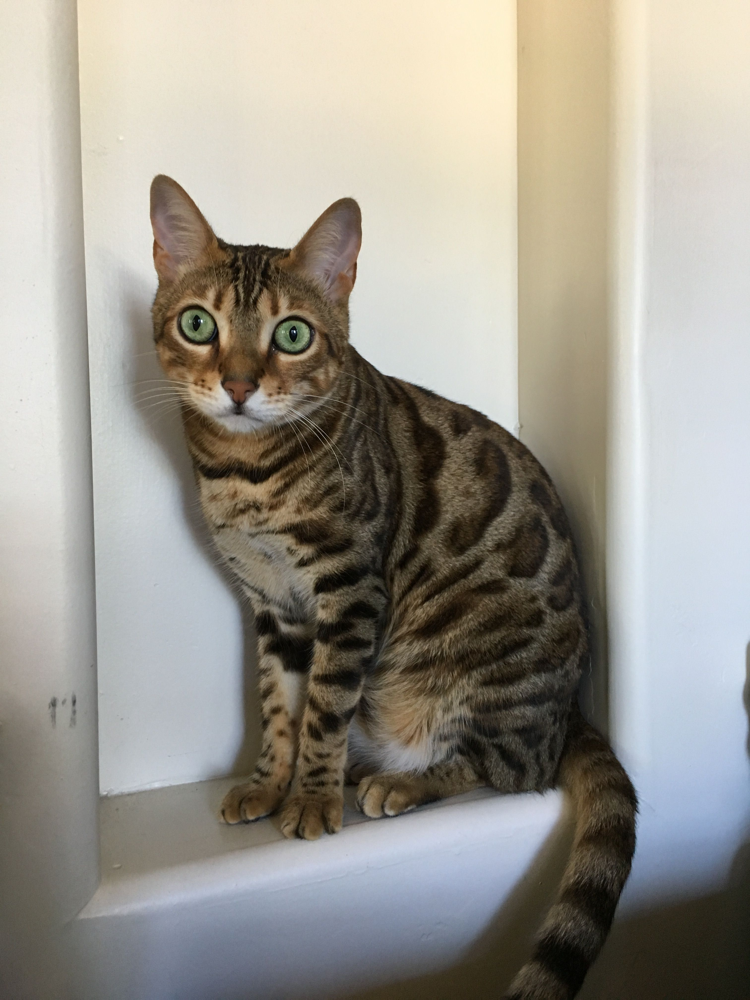

In [5]:
bengal = list(data_dir.glob('bengal/*'))
PIL.Image.open(str(bengal[0]))

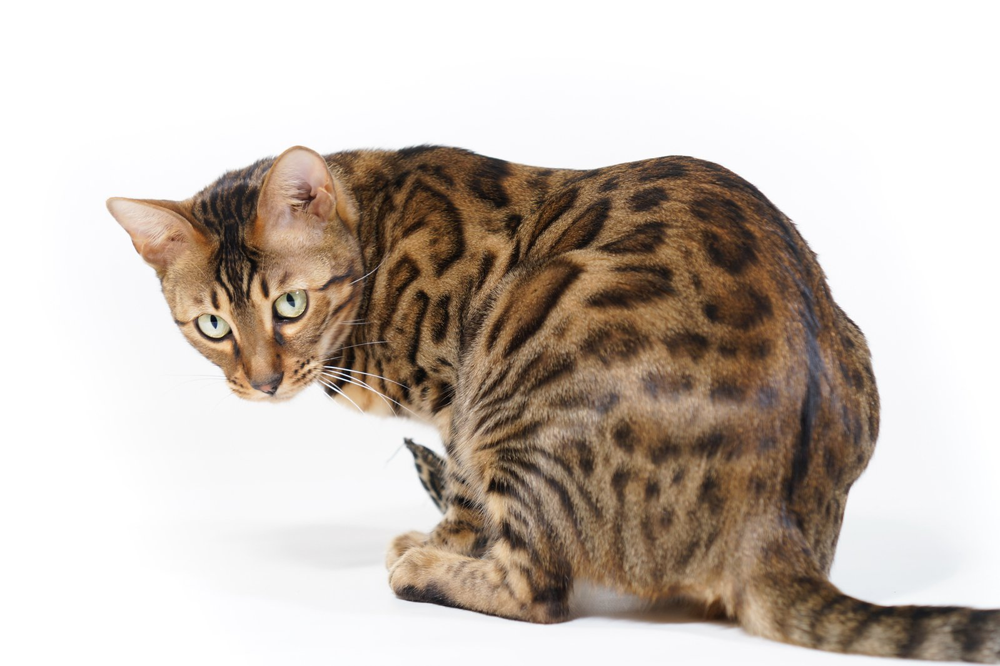

In [6]:
PIL.Image.open(str(bengal[1]))


## Traing and Validation Dataset

In [7]:
batch_size = 32
img_height = 180
img_width = 180

In [8]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


Found 951 files belonging to 5 classes.
Using 761 files for training.


In [9]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 951 files belonging to 5 classes.
Using 190 files for validation.


### The different cat breeds tested

In [10]:
class_names = train_ds.class_names
print(class_names)

['bengal', 'domestic_shorthair', 'maine_coon', 'ragdoll', 'siamese']


## Visualize data

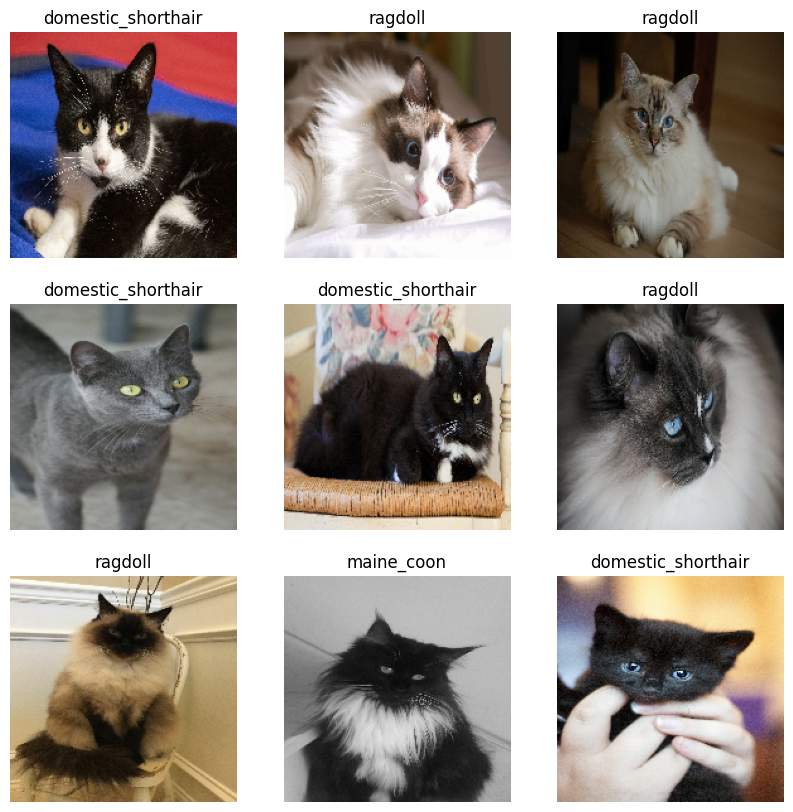

In [11]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [12]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


### Tuning improves performance

In [13]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

## Standardize Data

In [14]:
normalization_layer = layers.Rescaling(1./255)
print(normalization_layer)

#### normalize data

In [15]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
print(np.min(first_image), np.max(first_image))

2023-12-06 10:49:32.810615: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] Filling up shuffle buffer (this may take a while): 9 of 1000


0.0 1.0


2023-12-06 10:49:36.357033: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] Shuffle buffer filled.


## Model 1: Baseline Model

In [54]:
num_classes = len(class_names)

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [55]:
import tensorflow as tf

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',  
    patience=2,  
    restore_best_weights=True  

epochs = 25

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[early_stopping]
)

Epoch 1/25
24/24 [==============================] - 8s 301ms/step - loss: 1.7632 - accuracy: 0.2352 - val_loss: 1.6086 - val_accuracy: 0.2158
Epoch 2/25
24/24 [==============================] - 7s 301ms/step - loss: 1.4818 - accuracy: 0.3666 - val_loss: 1.4932 - val_accuracy: 0.4000
Epoch 3/25
24/24 [==============================] - 7s 297ms/step - loss: 1.3178 - accuracy: 0.4573 - val_loss: 1.5127 - val_accuracy: 0.4000
Epoch 4/25
24/24 [==============================] - 7s 289ms/step - loss: 1.2453 - accuracy: 0.4652 - val_loss: 1.3451 - val_accuracy: 0.4526
Epoch 5/25
24/24 [==============================] - 7s 298ms/step - loss: 1.0671 - accuracy: 0.5821 - val_loss: 1.3667 - val_accuracy: 0.4211
Epoch 6/25
24/24 [==============================] - 7s 300ms/step - loss: 0.9503 - accuracy: 0.6544 - val_loss: 1.3011 - val_accuracy: 0.4579
Epoch 7/25
24/24 [==============================] - 7s 306ms/step - loss: 0.7588 - accuracy: 0.7240 - val_loss: 1.4809 - val_accuracy: 0.4368
Epoch 

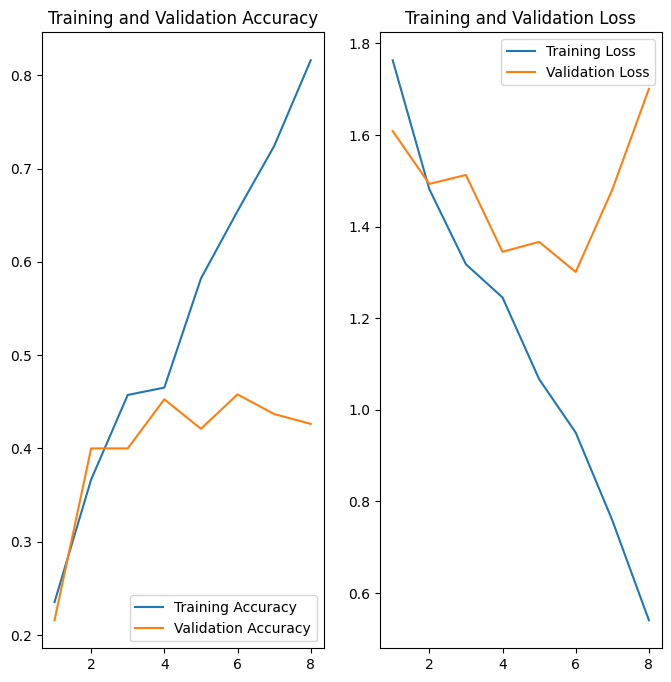

In [56]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(1, len(history.history['accuracy']) + 1)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Accuracy Report for Model 1: Baseline Model

In [58]:
import numpy as np
from sklearn.metrics import classification_report, accuracy_score

true_labels = []
for images, labels in val_ds:
    true_labels.extend(labels.numpy())

predictions = model.predict(val_ds)

predicted_labels = np.argmax(predictions, axis=1)

accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Accuracy: {accuracy:.4f}")

class_report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:")
print(class_report)

6/6 [==============================] - 1s 91ms/step
Accuracy: 0.4579
Classification Report:
                    precision    recall  f1-score   support

            bengal       0.59      0.62      0.60        39
domestic_shorthair       0.38      0.16      0.23        31
        maine_coon       0.41      0.27      0.33        48
           ragdoll       0.48      0.65      0.55        31
           siamese       0.40      0.61      0.49        41

          accuracy                           0.46       190
         macro avg       0.45      0.46      0.44       190
      weighted avg       0.45      0.46      0.44       190



## Model 2: Regularize Model 1

In [67]:
from tensorflow.keras import layers, models, regularizers, callbacks

num_classes = len(class_names)

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
  layers.Dropout(0.5),  
  layers.Dense(num_classes, kernel_regularizer=regularizers.l2(0.01))
])

In [68]:
import tensorflow as tf

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',  
    patience=3,  
    restore_best_weights=True  

epochs = 25

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[early_stopping]
)

Epoch 1/25
24/24 [==============================] - 8s 301ms/step - loss: 3.5247 - accuracy: 0.2024 - val_loss: 2.7408 - val_accuracy: 0.2737
Epoch 2/25
24/24 [==============================] - 7s 292ms/step - loss: 2.4237 - accuracy: 0.2957 - val_loss: 2.1087 - val_accuracy: 0.3105
Epoch 3/25
24/24 [==============================] - 7s 292ms/step - loss: 1.9861 - accuracy: 0.3732 - val_loss: 1.9560 - val_accuracy: 0.3842
Epoch 4/25
24/24 [==============================] - 7s 292ms/step - loss: 1.8940 - accuracy: 0.3811 - val_loss: 1.8086 - val_accuracy: 0.4368
Epoch 5/25
24/24 [==============================] - 7s 294ms/step - loss: 1.7801 - accuracy: 0.4113 - val_loss: 1.7482 - val_accuracy: 0.4211
Epoch 6/25
24/24 [==============================] - 7s 292ms/step - loss: 1.7262 - accuracy: 0.4139 - val_loss: 1.7241 - val_accuracy: 0.3842
Epoch 7/25
24/24 [==============================] - 7s 296ms/step - loss: 1.7054 - accuracy: 0.4336 - val_loss: 1.6850 - val_accuracy: 0.4632
Epoch 

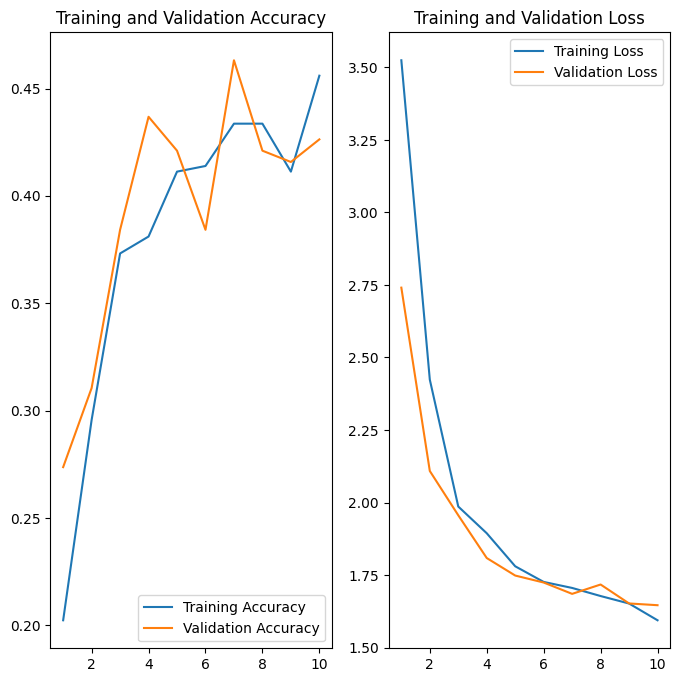

In [69]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(1, len(history.history['accuracy']) + 1)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Model 2: Regularization Classification report

In [70]:
import numpy as np
from sklearn.metrics import classification_report, accuracy_score

true_labels = []
for images, labels in val_ds:
    true_labels.extend(labels.numpy())

predictions = model.predict(val_ds)

predicted_labels = np.argmax(predictions, axis=1)

accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Accuracy: {accuracy:.4f}")

class_report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:")
print(class_report)

6/6 [==============================] - 1s 89ms/step
Accuracy: 0.4632
Classification Report:
                    precision    recall  f1-score   support

            bengal       0.53      0.62      0.57        39
domestic_shorthair       0.33      0.06      0.11        31
        maine_coon       0.42      0.52      0.46        48
           ragdoll       0.44      0.87      0.58        31
           siamese       0.59      0.24      0.34        41

          accuracy                           0.46       190
         macro avg       0.46      0.46      0.41       190
      weighted avg       0.47      0.46      0.42       190



## Data Augmentation

In [71]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",input_shape=(img_height,img_width,3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

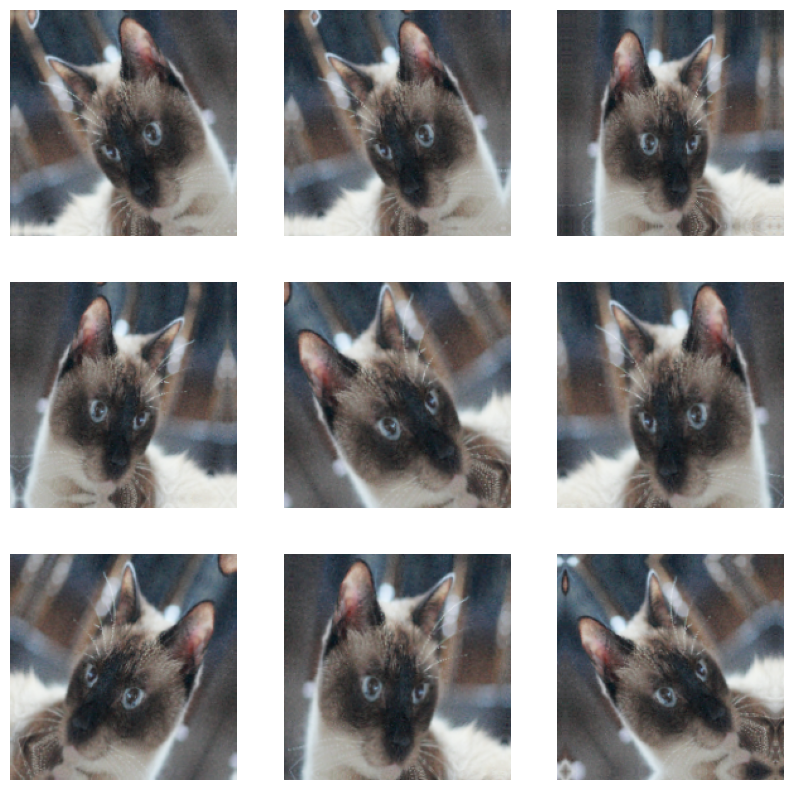

In [72]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

# Model 3 with Data Augementation

In [125]:
from tensorflow.keras import layers, models, regularizers, callbacks

num_classes = len(class_names)

model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
  layers.Dropout(0.5),  

  layers.Dense(num_classes, kernel_regularizer=regularizers.l2(0.01))
])

In [126]:
import tensorflow as tf

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', 
    patience=3, 
    restore_best_weights=True  
)

epochs = 25

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[early_stopping]
)

Epoch 1/25
24/24 [==============================] - 12s 429ms/step - loss: 3.6354 - accuracy: 0.2221 - val_loss: 2.8529 - val_accuracy: 0.2368
Epoch 2/25
24/24 [==============================] - 10s 427ms/step - loss: 2.5523 - accuracy: 0.2641 - val_loss: 2.3037 - val_accuracy: 0.3000
Epoch 3/25
24/24 [==============================] - 10s 421ms/step - loss: 2.1739 - accuracy: 0.2865 - val_loss: 2.0355 - val_accuracy: 0.3105
Epoch 4/25
24/24 [==============================] - 10s 428ms/step - loss: 1.9677 - accuracy: 0.3154 - val_loss: 1.8898 - val_accuracy: 0.3158
Epoch 5/25
24/24 [==============================] - 10s 420ms/step - loss: 1.8690 - accuracy: 0.3495 - val_loss: 1.7489 - val_accuracy: 0.3263
Epoch 6/25
24/24 [==============================] - 10s 426ms/step - loss: 1.7939 - accuracy: 0.3495 - val_loss: 1.7986 - val_accuracy: 0.2842
Epoch 7/25
24/24 [==============================] - 10s 425ms/step - loss: 1.7294 - accuracy: 0.3903 - val_loss: 1.6255 - val_accuracy: 0.4316

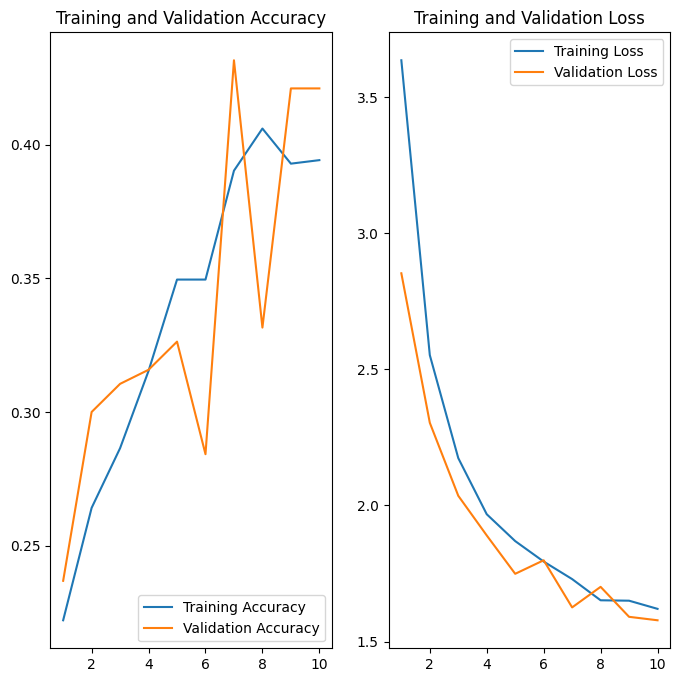

In [127]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(1, len(history.history['accuracy']) + 1)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Model 3: Regularized CNN with Data Augmentation

In [128]:
import numpy as np
from sklearn.metrics import classification_report, accuracy_score

true_labels = []
for images, labels in val_ds:
    true_labels.extend(labels.numpy())

predictions = model.predict(val_ds)

predicted_labels = np.argmax(predictions, axis=1)

accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Accuracy: {accuracy:.4f}")

class_report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:")
print(class_report)

6/6 [==============================] - 1s 113ms/step
Accuracy: 0.4316
Classification Report:
                    precision    recall  f1-score   support

            bengal       0.40      0.82      0.53        39
domestic_shorthair       0.31      0.13      0.18        31
        maine_coon       0.70      0.15      0.24        48
           ragdoll       0.46      0.84      0.60        31
           siamese       0.43      0.32      0.37        41

          accuracy                           0.43       190
         macro avg       0.46      0.45      0.38       190
      weighted avg       0.48      0.43      0.38       190

